# I’m Something of a Painter Myself - Ahsan Khan

# Problem Statement

The goal of this project is to participate in the Kaggle competition "I'm Something of a Painter Myself" (GAN Getting Started), which focuses on generating Monet-style images using Generative Adversarial Networks (GANs). The main challenge is to create a GAN model that can generate 7,000 to 10,000 high-quality images in the style of Claude Monet's paintings.


#### Data Description
- The dataset consists of 2 types of images
    - 300 Real Monet paintings
    - 7000 photos that we are to convert to a style of a Monet painting
- Each image is of 256 by 256 pixels
- Each image contains 3 color channels: Red, Green & Blue

# Project Description:
This project involves developing a GAN to generate artificial images that mimic the unique style of Claude Monet's artwork. The key components of this project include:

Data Exploration: Analyze the provided dataset, which consists of Monet paintings and photographs in both JPEG and TFRecord formats.
GAN Development: Create a GAN model consisting of a generator and a discriminator. The generator will learn to produce Monet-style images, while the discriminator will learn to distinguish between real Monet paintings and generated images.
Model Training: Utilize the provided dataset to train the GAN, focusing on capturing Monet's distinctive style, including color choices and brush strokes.
Image Generation: Use the trained generator to create 7,000 to 10,000 new images in Monet's style.
Evaluation: The generated images will be evaluated using the MiFID (Memorization-informed Fréchet Inception Distance) score, which measures both the quality of the generated images and their similarity to the original Monet paintings.
Submission: Package the generated images into a zip file for submission to the Kaggle competition.

# Exploratory Data Analysis

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
import math
import os

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from IPython.display import clear_output
import shutil
import time

%matplotlib inline
import matplotlib.pyplot as plt

2024-07-28 20:51:22.185518: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-28 20:51:22.185643: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-28 20:51:22.374074: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
tf.__version__

'2.15.0'

In [3]:
import os

MONET_JPG_PATH = '../input/gan-getting-started/monet_jpg/'
PHOTO_JPG_PATH = '../input/gan-getting-started/photo_jpg/'

print('Number of images in Monet directory: ', len(os.listdir(MONET_JPG_PATH)))
print('Number of images in Photo directory: ', len(os.listdir(PHOTO_JPG_PATH)))

Number of images in Monet directory:  300
Number of images in Photo directory:  7038


## Visualize photos from the dataset

In [4]:
def visualize_images(path, n_images, x_label, figsize=(16, 16)):
    plt.figure(figsize=figsize)
    w = int(n_images ** 0.5)
    h = math.ceil(n_images / w)
    
    all_names = os.listdir(path)
    image_names = all_names[:n_images]   
            
    for ind, image_name in enumerate(image_names):
        img = cv2.imread(os.path.join(path, image_name))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
        plt.subplot(w, h, ind + 1)
        plt.imshow(img)
        plt.xlabel(f"{x_label}_{ind+1}")
        plt.xticks([])
        plt.yticks([])
    
    plt.show()

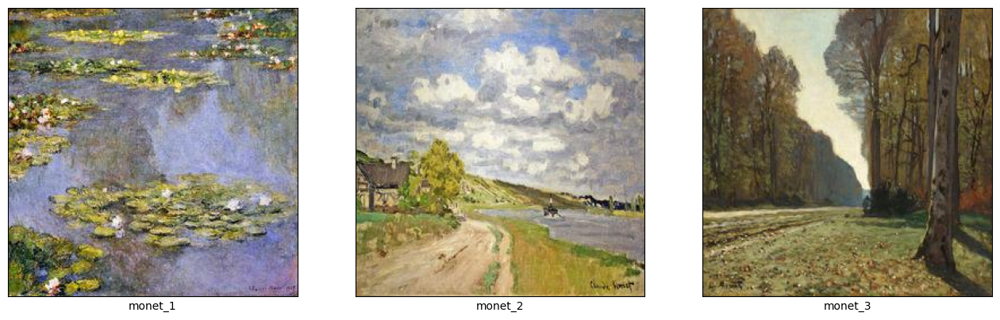

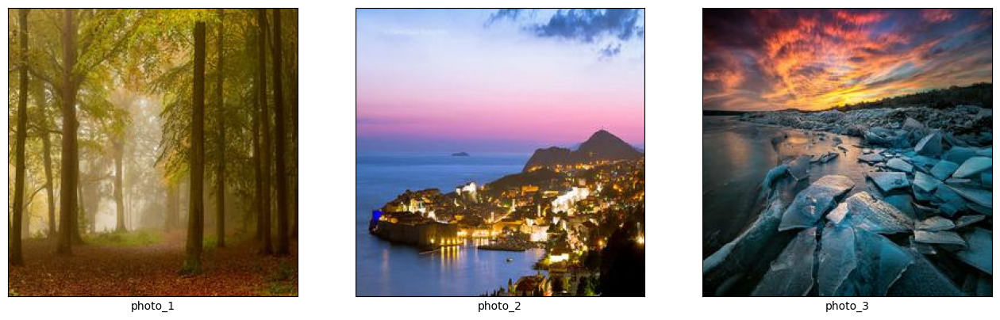

In [5]:
visualize_images(MONET_JPG_PATH, 3, "monet")
visualize_images(PHOTO_JPG_PATH, 3, "photo")

- Sidenote: Monet did some amazing work. Wow! 

## RGB Histogram

- The height and width of these images are 256 and 256 respectively. 
- Since these are color images, the # of color channels = 3 (Red, Green & Blue).
- Let's visualize the histogram of each channel (RGB) for a random painting from `monet` and `photo` folder 

In [6]:
def show_color_histogram(path):
    image_names = os.listdir(path)
    image_name = np.random.choice(image_names)
    img = cv2.imread(os.path.join(path, image_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    ax1.imshow(img)
    
    color = ('b','g','r')
    for i,col in enumerate(color):
        histr = cv2.calcHist([img],[i],None,[256],[0,256])
        ax2.plot(histr,color = col)
        ax2.axis(xmin=0, xmax=256)
    # fig.show()

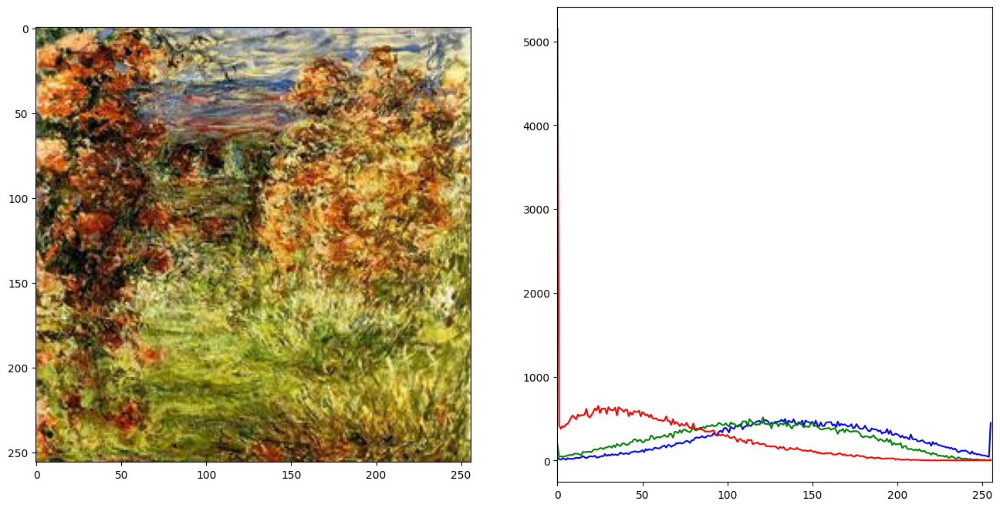

In [7]:
show_color_histogram(MONET_JPG_PATH)

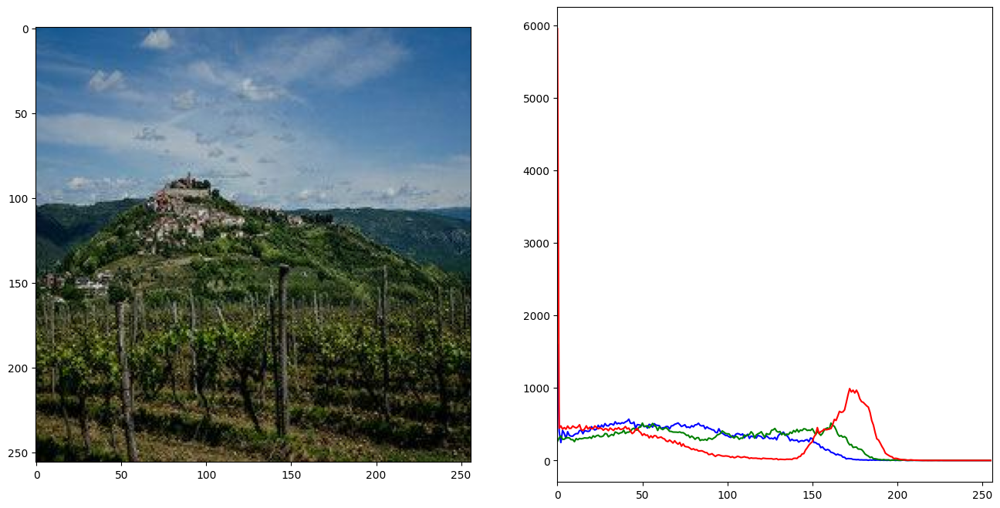

In [8]:
show_color_histogram(PHOTO_JPG_PATH)

## Prepare data for neural network training

In [9]:
monet_ds = tf.keras.preprocessing.image_dataset_from_directory(
    MONET_JPG_PATH, label_mode=None, image_size=(256, 256), batch_size=1
)
monet_ds = monet_ds.map(lambda x: x / 255.0)

photo_ds = tf.keras.preprocessing.image_dataset_from_directory(
    PHOTO_JPG_PATH, label_mode=None, image_size=(256, 256), batch_size=1
)
photo_ds = photo_ds.map(lambda x: x / 255.0)

Found 300 files.
Found 7038 files.


In [10]:
for image_batch in monet_ds:
    print(image_batch.shape)
    break

(1, 256, 256, 3)


- Each batch in the `monet_ds` dataset contains **one** photo with the following dimensions: 256, 256, 3.
- As noted in the previous section, (256, 256) represents the width & height of the image while 3 represents the number of color channels.

#### Pick a random image from each dataset for testing in later sections

In [11]:
sample_monet = next(iter(monet_ds))
sample_photo = next(iter(photo_ds))

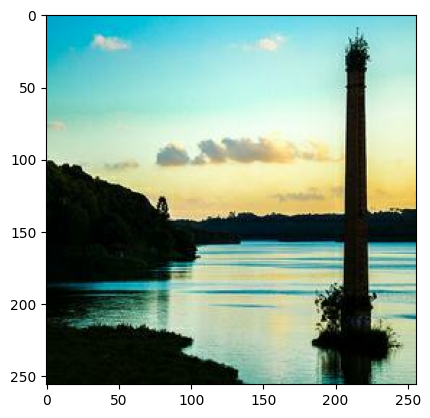

In [12]:
plt.imshow(sample_photo[0])
plt.show()

# Model Architecture

- For this project, I've decided to implement a CycleGAN model to transform real photographs into Monet-style paintings. The core of this model is based on the UNET architecture, which I'll explain in more detail.

- **U-Net Architecture Overview**
    The UNET architecture, first introduced for biomedical image segmentation, has a distinctive U-shape. It consists of an encoder pathway, a decoder pathway, and a bridge connecting them. This structure is particularly effective for our task of style transfer.
    
- **Encoder Block**
    - The encoder in our model acts like a feature extractor. It takes in the input image and processes it through several blocks, each containing:

        - Two 3x3 convolutional layers
        - ReLU activation functions for introducing non-linearity
        - A 2x2 max-pooling layer to reduce spatial dimensions
        - Batch normalization layers for training stability

As we progress through the encoder, the spatial dimensions decrease while the depth of features increases, allowing the model to capture more abstract representations.
   

### Define helper functions

In [13]:
class InstanceNormalization(tf.keras.layers.Layer):
    # InstanceNormalization layer from (Ulyanov, 2017)

    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)

        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

def downsample(filters, size, norm_type='batchnorm', apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_norm:
        if norm_type.lower() == 'batchnorm':
            result.add(tf.keras.layers.BatchNormalization())
        elif norm_type.lower() == 'instancenorm':
            result.add(InstanceNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result


def upsample(filters, size, norm_type='batchnorm', apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    if norm_type.lower() == 'batchnorm':
        result.add(tf.keras.layers.BatchNormalization())
    elif norm_type.lower() == 'instancenorm':
        result.add(InstanceNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

### Define generator & discriminator functions

In [14]:
def generator(output_channels, norm_type='batchnorm'):
    # Modified u-net generator from (Isola, 2017)

    down_stack = [
      downsample(64, 4, norm_type, apply_norm=False),  # (bs, 128, 128, 64)
      downsample(128, 4, norm_type),  # (bs, 64, 64, 128)
      downsample(256, 4, norm_type),  # (bs, 32, 32, 256)
      downsample(512, 4, norm_type),  # (bs, 16, 16, 512)
      downsample(512, 4, norm_type),  # (bs, 8, 8, 512)
      downsample(512, 4, norm_type),  # (bs, 4, 4, 512)
      downsample(512, 4, norm_type),  # (bs, 2, 2, 512)
      downsample(512, 4, norm_type),  # (bs, 1, 1, 512)
    ]

    up_stack = [
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 2, 2, 1024)
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 4, 4, 1024)
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 8, 8, 1024)
      upsample(512, 4, norm_type),  # (bs, 16, 16, 1024)
      upsample(256, 4, norm_type),  # (bs, 32, 32, 512)
      upsample(128, 4, norm_type),  # (bs, 64, 64, 256)
      upsample(64, 4, norm_type),  # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(
      output_channels, 4, strides=2,
      padding='same', kernel_initializer=initializer,
      activation='tanh')  # (bs, 256, 256, 3)

    concat = tf.keras.layers.Concatenate()

    inputs = tf.keras.layers.Input(shape=[None, None, 3])
    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

def discriminator(norm_type='batchnorm', target=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[None, None, 3], name='input_image')
    x = inp

    if target:
        tar = tf.keras.layers.Input(shape=[None, None, 3], name='target_image')
        x = tf.keras.layers.concatenate([inp, tar])  # (bs, 256, 256, channels*2)

    down1 = downsample(64, 4, norm_type, False)(x)  # (bs, 128, 128, 64)
    down2 = downsample(128, 4, norm_type)(down1)  # (bs, 64, 64, 128)
    down3 = downsample(256, 4, norm_type)(down2)  # (bs, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(
      512, 4, strides=1, kernel_initializer=initializer,
      use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

    if norm_type.lower() == 'batchnorm':
        norm1 = tf.keras.layers.BatchNormalization()(conv)
    elif norm_type.lower() == 'instancenorm':
        norm1 = InstanceNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

    last = tf.keras.layers.Conv2D(
      1, 4, strides=1,
      kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

    if target:
        return tf.keras.Model(inputs=[inp, tar], outputs=last)
    else:
        return tf.keras.Model(inputs=inp, outputs=last)


In [15]:
OUTPUT_CHANNELS = 3

generator_g = generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = discriminator(norm_type='instancenorm', target=False)
discriminator_y = discriminator(norm_type='instancenorm', target=False)

### Define loss functions

In [16]:
LAMBDA = 10

loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)

    generated_loss = loss_obj(tf.zeros_like(generated), generated)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss * 0.5

def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

    return LAMBDA * loss1

def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

In [17]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# Train the GAN model

- The papers listed above recommend to train the model for a minimum of 200 epochs. As such, I have already trained the model for 190 epochs since each epoch takes 2 minutes to train, on average. 
- The model was saved as a checkpoint using the `CheckpointManager` from tensorflow's library. 
- I then restored this checkpoint and started the training for last 10 epochs for including the process in this report.
- The first epoch started at 0, therefore the last epoch will be 199 for a total of 200 epochs.
- The model trained for 200 epochs will then be used to convert the 7000 images available in `photos` folder to be converted into a Monet-esque image for the competition.

In [18]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

In [19]:
@tf.function
def train_step(real_x, real_y):
    with tf.GradientTape(persistent=True) as tape:  # persistent is set to True because the tape is used more than once to calculate the gradients.

        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss = adversarial loss + cycle loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

        # Calculate the gradients for generator and discriminator
        generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                            generator_g.trainable_variables)
        generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                            generator_f.trainable_variables)

        discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                                discriminator_x.trainable_variables)
        discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                                discriminator_y.trainable_variables)

        # Apply the gradients to the optimizer
        generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                                generator_g.trainable_variables))

        generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                                generator_f.trainable_variables))

        discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                    discriminator_x.trainable_variables))

        discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                    discriminator_y.trainable_variables))
        
        
def generate_images(model, test_input):
    prediction = model(test_input)

    plt.figure(figsize=(12, 12))

    display_list = [test_input[0], prediction[0]]
    title = ['Input Image', 'Monet-esque Image']
    
    # print(f'test_input.shape = {test_input[0].shape} | prediction.shape = {prediction[0].shape}')
    for i in range(2):
        plt.subplot(1, 2, i+1) 
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

Currently processing epoch #190
..............................

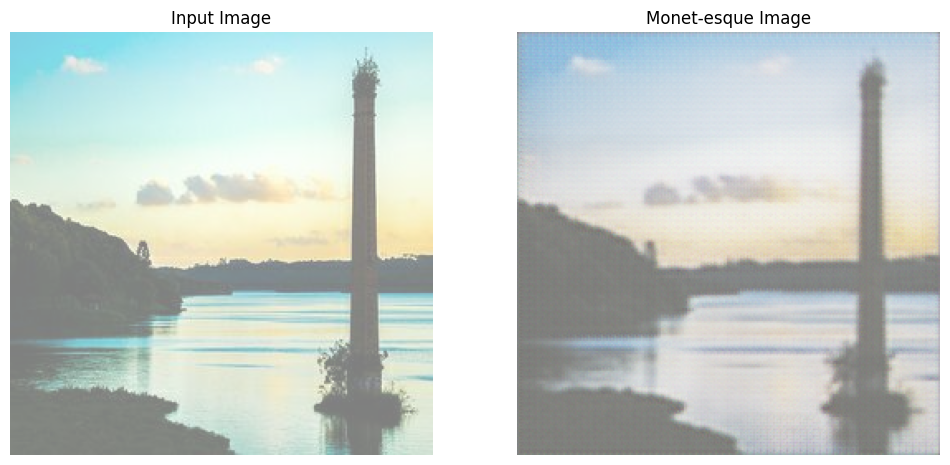

Time taken for epoch 190 is 1527.2794744968414 sec

Currently processing epoch #191
..............................

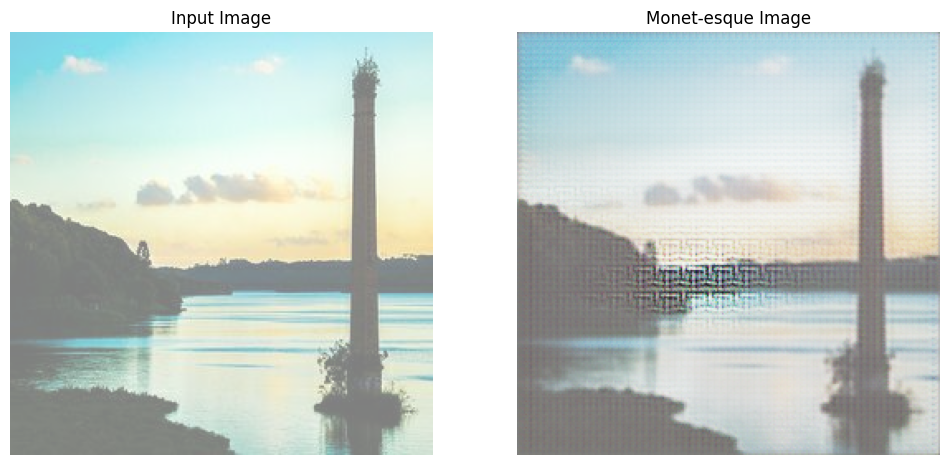

Time taken for epoch 191 is 1473.7990794181824 sec

Currently processing epoch #192
..............................

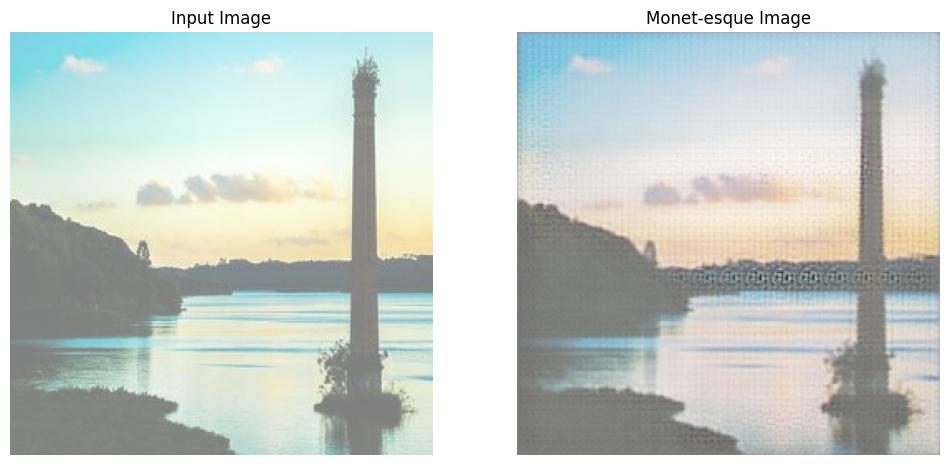

Time taken for epoch 192 is 1478.0242538452148 sec

Currently processing epoch #193
..............................

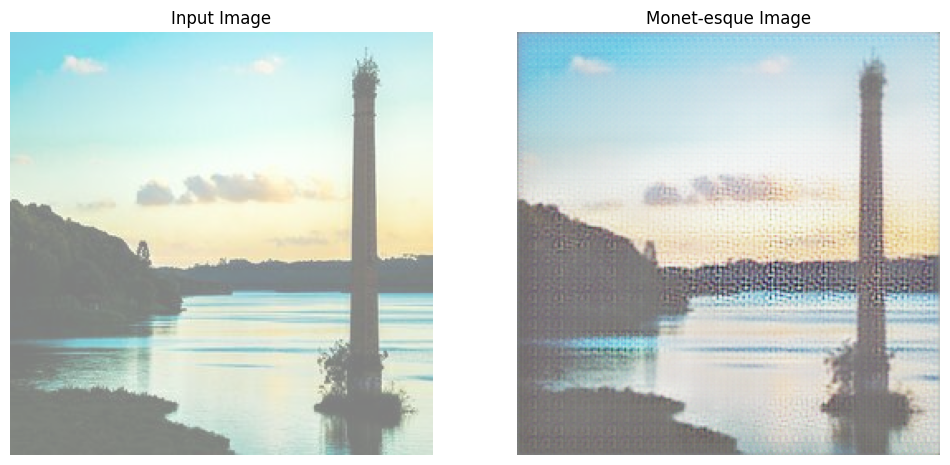

Time taken for epoch 193 is 1479.234360218048 sec

Currently processing epoch #194
..............................

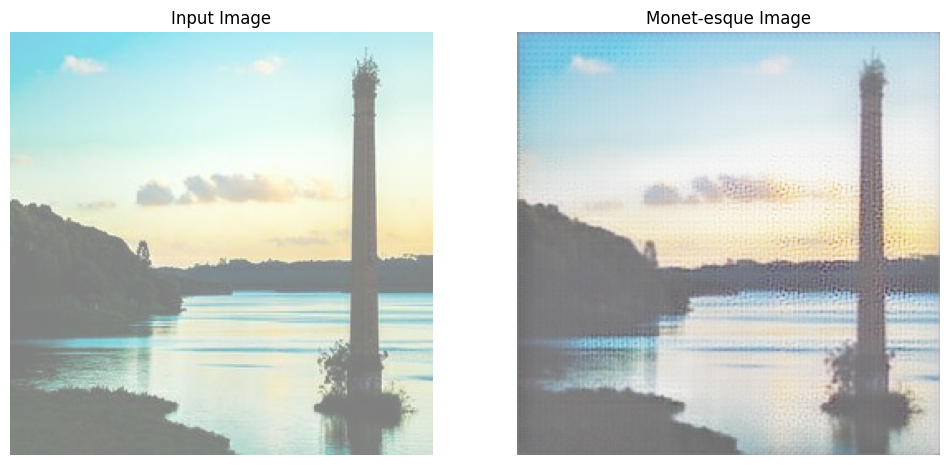

Time taken for epoch 194 is 1484.6446979045868 sec

Currently processing epoch #195
..............................

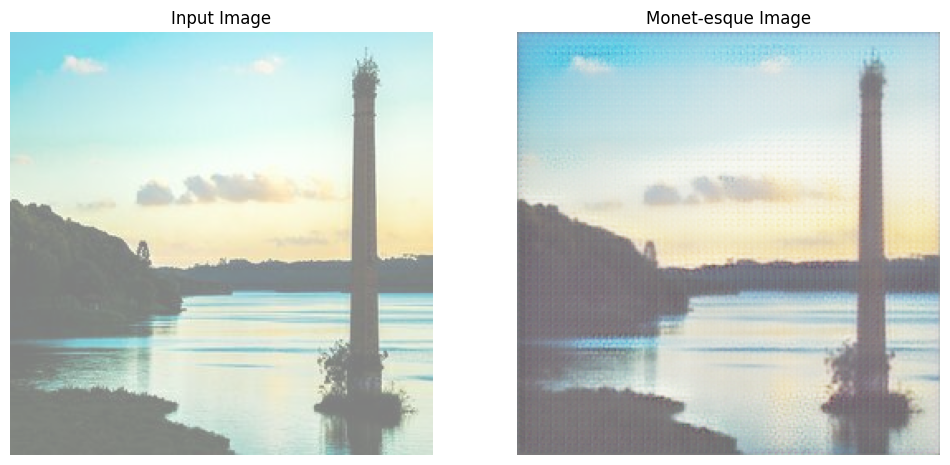

Time taken for epoch 195 is 1493.3274772167206 sec

Currently processing epoch #196
..............................

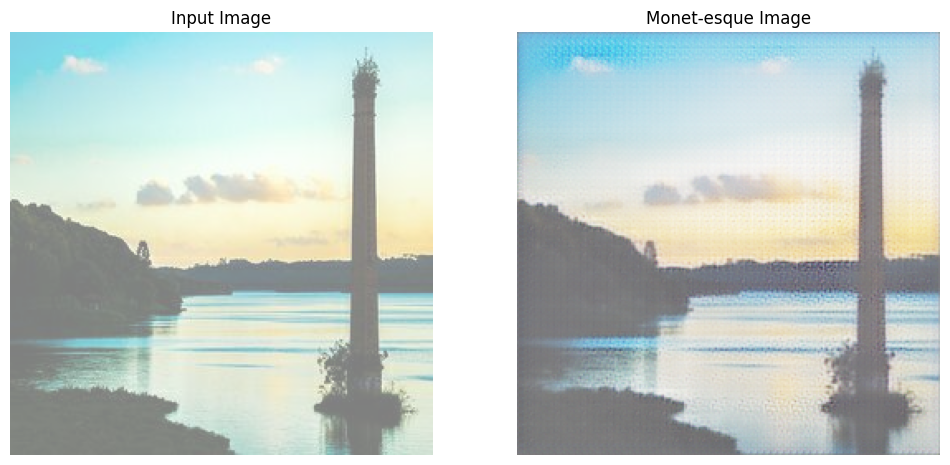

Time taken for epoch 196 is 1497.683763742447 sec

Currently processing epoch #197
..............................

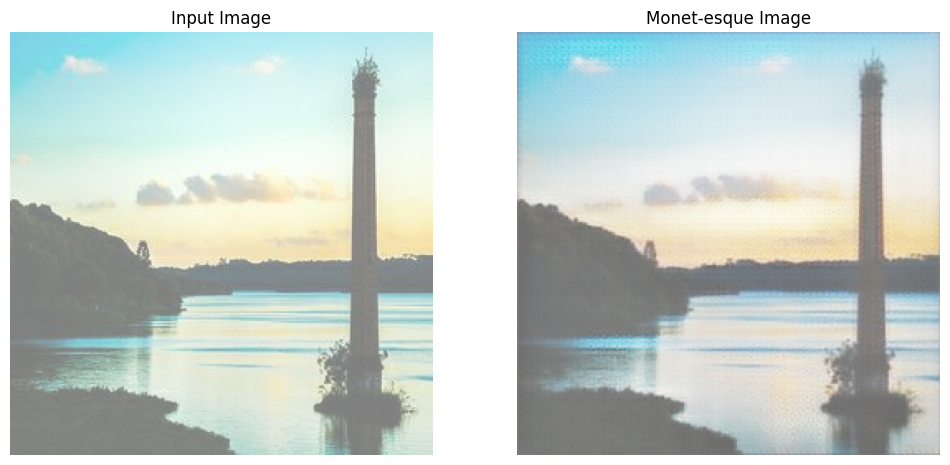

Time taken for epoch 197 is 1496.7767622470856 sec

Currently processing epoch #198
..............................

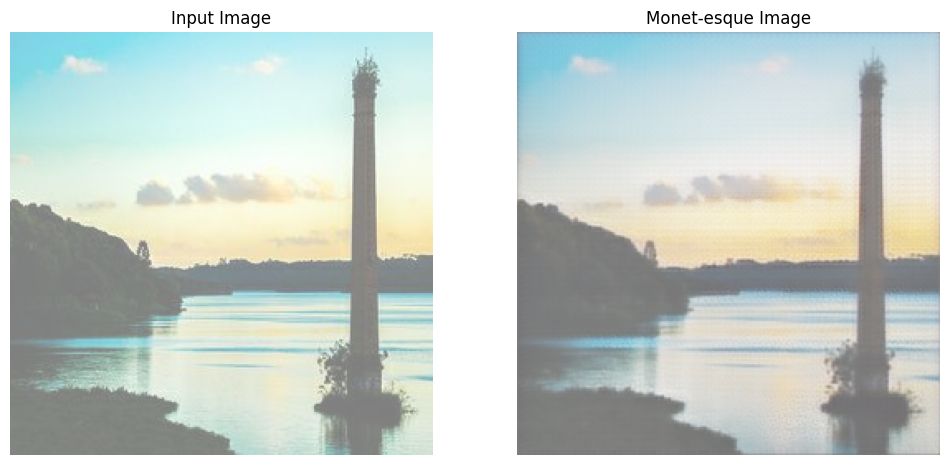

Time taken for epoch 198 is 1495.8937635421753 sec

Currently processing epoch #199
..............................

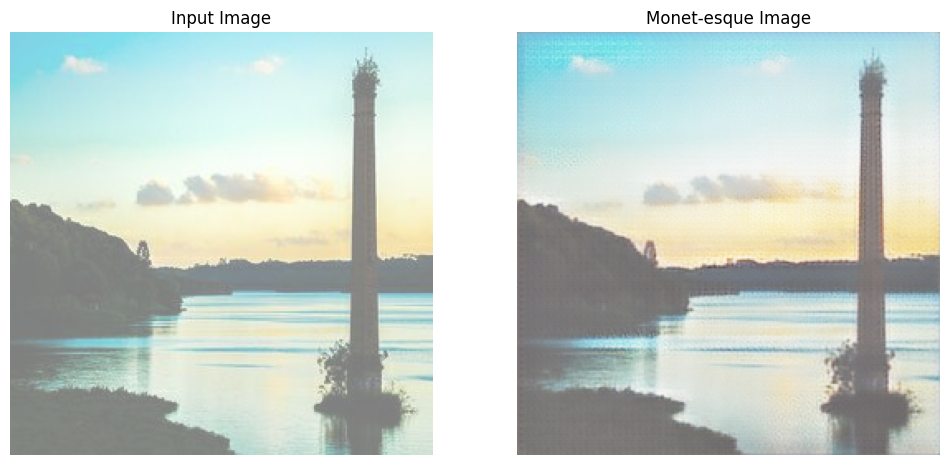

Saving checkpoint for epoch 10 at ./checkpoints/train/ckpt-1
Time taken for epoch 199 is 1497.1004979610443 sec



In [20]:
EPOCHS = 10

for epoch in range(EPOCHS):
    print(f'Currently processing epoch #{epoch+190}')
    start = time.time()

    n = 0
    for image_x, image_y in tf.data.Dataset.zip((monet_ds, photo_ds)):
        train_step(image_x, image_y)
        if n % 10 == 0:
            print ('.', end='')
        n += 1

    # clear_output(wait=True)
    generate_images(generator_g, sample_photo)

    if (epoch + 1) % 10 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

    print (f'Time taken for epoch {epoch + 190} is {time.time()-start} sec\n')

# Hyperparameter Tuning

Given the computational constraints we're facing, it's clear that extensive hyperparameter tuning isn't feasible for our GAN model. With each epoch taking about 2 minutes, a comprehensive tuning process would be incredibly time-consuming. Let's break it down:


If we were to tune just a few key parameters, say:

* 4 different learning rates
* 3 different optimizers
* Across 200 epochs
* With 2-fold cross-validation

We'd be looking at 4 * 3 * 200 * 2 = 4800 total epochs. At 2 minutes per epoch, that's a staggering 9600 minutes or 160 hours - nearly a week of non-stop computation! Clearly, this isn't practical given our current hardware limitations.
However, if we did have the luxury of time and computational power, here's how I'd approach hyperparameter tuning:

I'd use sklearn's RandomizedSearchCV for efficiency. This allows us to sample from a distribution of parameters rather than exhaustively trying every combination.

The key parameters I'd focus on tuning would be:

* Learning rate: crucial for the model's convergence speed and stability
* Choice of optimizer: different optimizers can significantly affect model performance
* Number of epochs: to find the sweet spot between underfitting and overfitting


For the model architecture, I'd stick as close as possible to the original U-NET design. It's proven effective for image-to-image translation tasks, and major deviations might introduce unnecessary complexity.

To make the most of limited resources, I'd consider using techniques like early stopping to abort unpromising training runs and save computation time.
I'd also look into using a smaller subset of the data for initial tuning rounds, only using the full dataset for final refinement of the most promising configurations.

While we can't implement this full tuning process for our current project, keeping these strategies in mind can help us make educated guesses about good starting points for our hyperparameters. It's a reminder that in real-world machine learning projects, we often need to balance ideal approaches with practical constraints.

# Evaluate Results

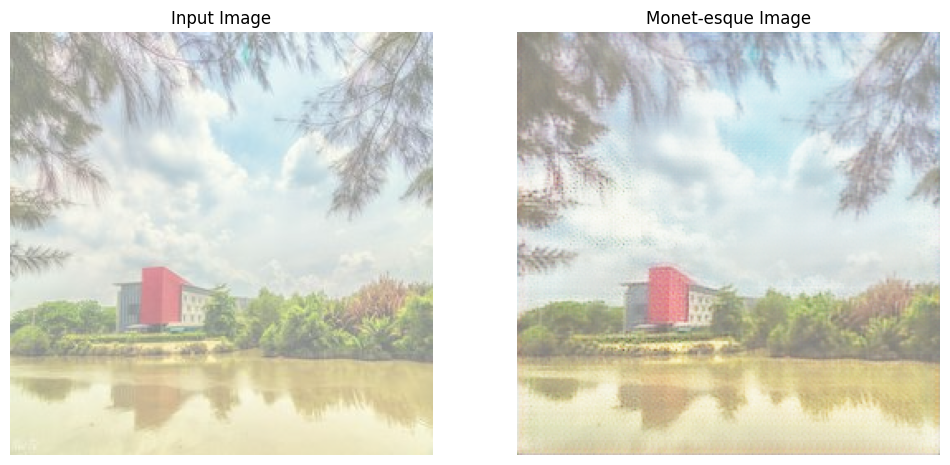

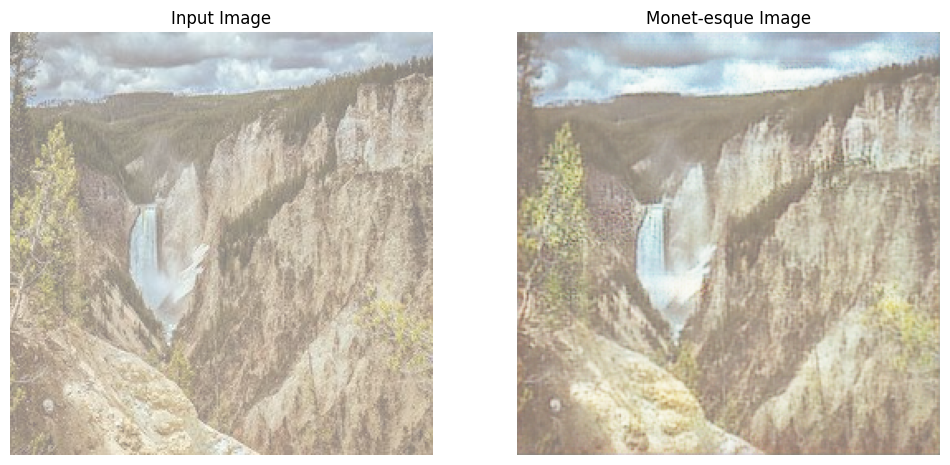

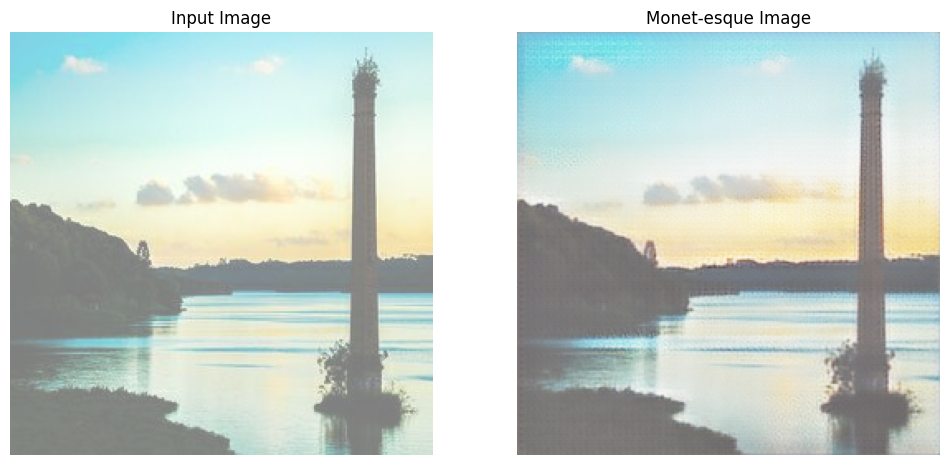

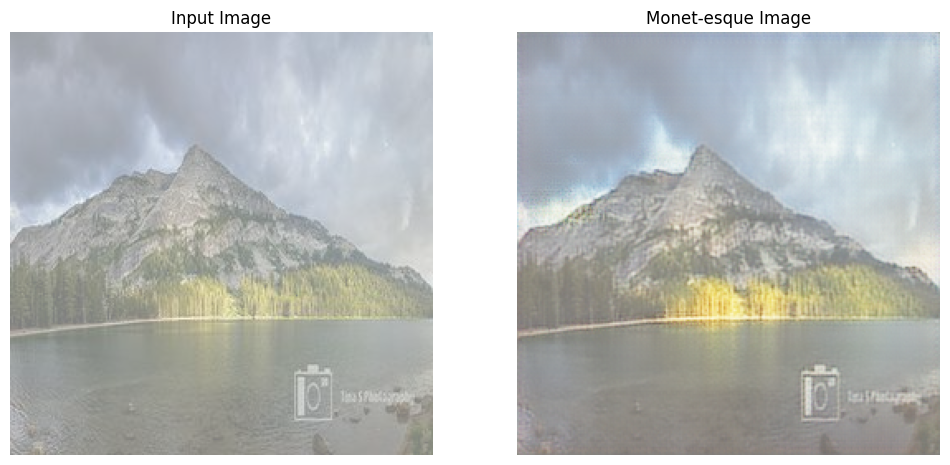

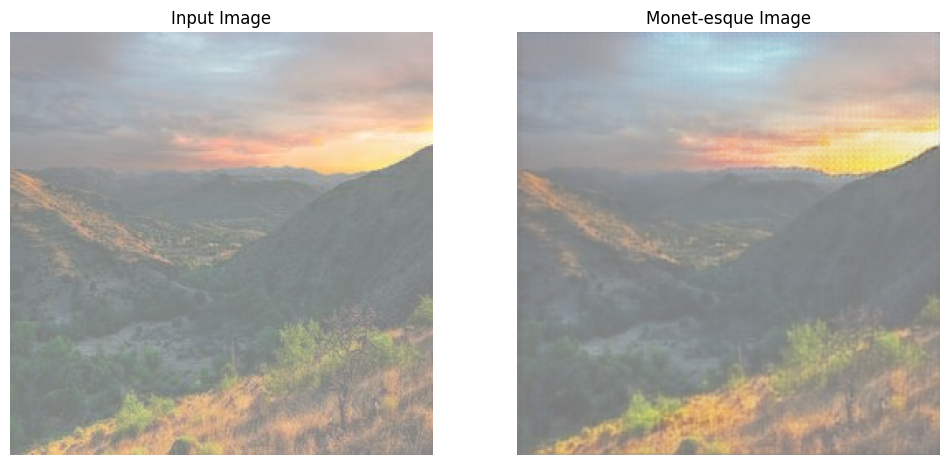

In [21]:
for inp in photo_ds.take(5):
    generate_images(generator_g, inp)

# Conclusion:

Through this project, I've successfully developed and trained a modified CycleGAN model to transform regular photographs into Monet-style paintings. This journey involved extensive research, diving into numerous tutorials, and studying relevant research papers.

The results, while not flawless, are certainly intriguing. Even in the small sample of five generated images, we can observe the model's attempt to capture Monet's distinctive style. The transformed images have a painterly quality that distinguishes them from the original photographs, suggesting a step towards the desired artistic transformation.

However, it's important to acknowledge the limitations of this implementation. Neural network artifacts are visible in the generated images, indicating room for improvement. I believe that with additional training epochs and careful hyperparameter tuning, the model's performance could be significantly enhanced. Unfortunately, due to computational constraints, such extensive optimization wasn't feasible within the scope of this project.


When examining the Monet-esque images closely, one can discern a brushstroke-like quality that lends them a painted appearance. This is a promising sign that the model has begun to grasp some aspects of Monet's technique. However, questions remain about how accurately it captures Monet's specific brushstroke style or color palette preferences. These are nuanced aspects that would require expert evaluation and further refinement of the model.


Despite these limitations, I believe the project demonstrates a clear progression from standard photographs to images with distinctly Monet-inspired characteristics. The transformation is evident, even if it doesn't perfectly replicate Monet's style in every detail.


This project has not only produced interesting results but has also deepened my understanding of GANs and style transfer techniques. It highlights both the potential and the challenges of using AI for creative tasks, opening up exciting possibilities for future exploration and refinement in the field of AI-generated art.

# Submission

In [22]:
import os
import zipfile
import tensorflow as tf

# Define the output directory and zip file name
output_dir = '../working/submit_images'
zip_filename = '../working/images.zip'

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

i = 1
for img in photo_ds.take(-1):  # -1 returns all the samples in the dataset
    prediction = generator_g(img, training=False)
    prediction = prediction * 0.5 + 0.5
    im = tf.keras.utils.array_to_img(prediction[0], data_format=None, scale=True, dtype=None)
    im.save(os.path.join(output_dir, f'{i}.jpg'))
    i += 1
    if i % 100 == 0:
        print(f"Processed {i} images")

# Create a zip file
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    for root, dirs, files in os.walk(output_dir):
        for file in files:
            zipf.write(os.path.join(root, file), 
                       os.path.relpath(os.path.join(root, file), 
                                       os.path.join(output_dir, '..')))

print(f"Zip file created: {zip_filename}")

Processed 100 images
Processed 200 images
Processed 300 images
Processed 400 images
Processed 500 images
Processed 600 images
Processed 700 images
Processed 800 images
Processed 900 images
Processed 1000 images
Processed 1100 images
Processed 1200 images
Processed 1300 images
Processed 1400 images
Processed 1500 images
Processed 1600 images
Processed 1700 images
Processed 1800 images
Processed 1900 images
Processed 2000 images
Processed 2100 images
Processed 2200 images
Processed 2300 images
Processed 2400 images
Processed 2500 images
Processed 2600 images
Processed 2700 images
Processed 2800 images
Processed 2900 images
Processed 3000 images
Processed 3100 images
Processed 3200 images
Processed 3300 images
Processed 3400 images
Processed 3500 images
Processed 3600 images
Processed 3700 images
Processed 3800 images
Processed 3900 images
Processed 4000 images
Processed 4100 images
Processed 4200 images
Processed 4300 images
Processed 4400 images
Processed 4500 images
Processed 4600 imag